In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
print("CUDA Available:", torch.cuda.is_available())
print("CUDA Version:", torch.version.cuda)
print("cuDNN Version:", torch.backends.cudnn.version())
print("Device Count:", torch.cuda.device_count())
print("Current Device:", torch.cuda.current_device())
print("Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")

Using device: cuda
CUDA Available: True
CUDA Version: 12.1
cuDNN Version: 90100
Device Count: 2
Current Device: 0
Device Name: Tesla T4


In [ ]:
!nvidia-smi

Sat Mar 29 21:47:41 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   47C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import WeightedRandomSampler
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (accuracy_score, balanced_accuracy_score, recall_score,
                             f1_score, roc_auc_score, roc_curve, confusion_matrix,
                             classification_report, auc)
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
import albumentations as A
from albumentations.pytorch import ToTensorV2
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
# Dataset Class
class SkinLesionDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        if isinstance(csv_file, pd.DataFrame):
            self.data = csv_file
        else:
            self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.domain_map = {
            'torso': 0, 'lower extremity': 1, 'upper extremity': 2, 'anterior torso': 3,
            'head/neck': 4, 'posterior torso': 5, 'palms/soles': 6, 'oral/genital': 7,
            'lateral torso': 8, 'unknown': 9
        }
        self.diagnosis_to_target = {
            'NV': 5, 'MEL': 4, 'BKL': 2, 'DF': 3, 'SCC': 6, 'BCC': 1, 'VASC': 8, 'AK': 0, 'UNK': 7
        }

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx]['path']
        if not os.path.exists(img_path):
            raise ValueError(f"Error: Image at {img_path} not found.")
        image = cv2.imread(img_path)
        if image is None:
            raise ValueError(f"Error: Unable to read image at {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = int(self.data.iloc[idx]['target'])
        anatom_site = str(self.data.iloc[idx]['anatom_site_general']).lower()
        domain = self.domain_map.get(anatom_site, 9)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented["image"]
        return image, label, domain

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Mean & std for normalization (ImageNet values)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Improved training augmentations
train_transforms = A.Compose([
    A.LongestMaxSize(1024, p=1),
    A.PadIfNeeded(min_height=1024, min_width=1024, p=1, border_mode=cv2.BORDER_REFLECT_101, value=0),
    A.RandomResizedCrop(height=224, width=224, scale=(0.8, 1.0), ratio=(0.9, 1.1), interpolation=cv2.INTER_CUBIC, p=1),
    A.Rotate(limit=5, p=0.5),  # Reduced rotation
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Affine(scale=(0.98, 1.02), rotate=(-5, 5), shear=(-2, 2), p=0.5),  # Less distortion
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.2, hue=0.05, p=0.5),  # Reduced color augmentation
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
    A.HueSaturationValue(hue_shift_limit=1, sat_shift_limit=10, val_shift_limit=15, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.005, scale_limit=0.005, rotate_limit=10, border_mode=cv2.BORDER_REFLECT, p=0.5),  # Prevent extreme shifts
    A.OneOf([
        A.Blur(blur_limit=3, p=0.3),  # Keep mild blur only
        A.GaussNoise(var_limit=(5.0, 10.0), p=0.3),
    ], p=0.5),
    A.Normalize(mean=mean, std=std),
    ToTensorV2(),
])

# Validation (No heavy augmentation)
val_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
])

# Test set transformations (same as validation)
test_transforms = val_transforms


In [ ]:
# Create dataset
dataset = SkinLesionDataset(csv_file="/kaggle/input/csvfile/whole_data_no_duplicates_kaggle.csv",transform=train_transforms)

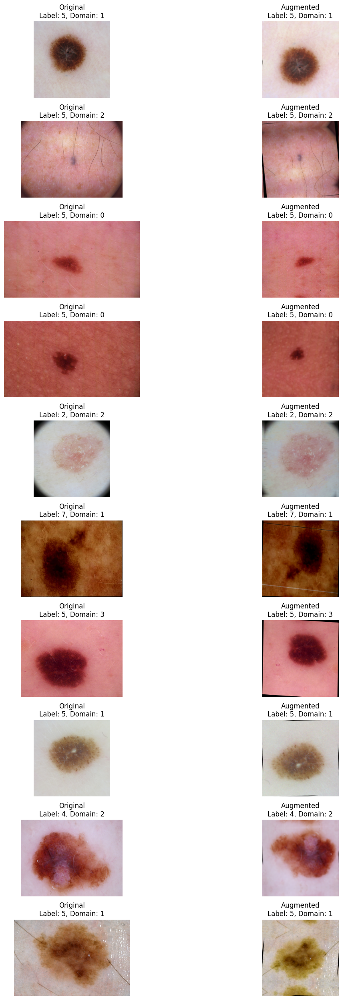

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2

def denormalize(image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Converts a normalized image back to the [0, 1] range.
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0)  # Convert (C, H, W) to (H, W, C)

    # Denormalize
    image = image * std + mean
    image = np.clip(image, 0, 1)  # Ensure values are in valid range

    return image

def visualize_augmentations(dataset, num_images=10):
    """
    Visualizes original and augmented images side by side.

    Args:
        dataset: The dataset object (instance of `SkinLesionDataset`).
        num_images: Number of images to display (default=10).
    """
    fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 2.5))  # Each row has original & augmented image

    for i in range(num_images):
        idx = random.randint(0, len(dataset) - 1)

        # Load original image
        img_path = dataset.data.iloc[idx]['path']
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Load augmented image
        augmented_image, label, domain = dataset[idx]

        # Convert augmented image from tensor to NumPy
        if isinstance(augmented_image, torch.Tensor):
            augmented_image = denormalize(augmented_image)

        # Plot original image
        axes[i, 0].imshow(original_image)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"Original\nLabel: {label}, Domain: {domain}")

        # Plot augmented image
        axes[i, 1].imshow(augmented_image)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"Augmented\nLabel: {label}, Domain: {domain}")

    plt.subplots_adjust(hspace=0.5)  # Adjust spacing to prevent title overlap
    plt.tight_layout()
    plt.show()

# Call the function
visualize_augmentations(dataset, num_images=10)


In [ ]:
# Data Loaders
def collate_fn(batch):
    images = torch.stack([item[0] for item in batch])
    labels = torch.tensor([item[1] for item in batch], dtype=torch.long)
    domains = torch.tensor([item[2] for item in batch], dtype=torch.long)
    return images, labels, domains

In [ ]:
df = pd.read_csv("/kaggle/input/csvfile/whole_data_no_duplicates_kaggle.csv")
df["anatom_site_general"] = df["anatom_site_general"].fillna("unknown")
domain_labels = df["anatom_site_general"].values
train_val_df, test_df = train_test_split(df, test_size=0.1, stratify=domain_labels, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["anatom_site_general"], random_state=42)
print(f"Train Size: {len(train_df)}, Val Size: {len(val_df)}, Test Size: {len(test_df)}")

train_dataset = SkinLesionDataset(train_df, transform=train_transforms)
val_dataset = SkinLesionDataset(val_df, transform=val_transforms)
test_dataset = SkinLesionDataset(test_df, transform=test_transforms)

Train Size: 41255, Val Size: 10314, Test Size: 5730


In [ ]:
domain_counts = Counter(train_df["anatom_site_general"])
total_samples = sum(domain_counts.values())
weights = {domain: total_samples / count for domain, count in domain_counts.items()}
train_sample_weights = [weights[domain] for domain in train_df["anatom_site_general"]]
train_sampler = WeightedRandomSampler(train_sample_weights, num_samples=len(train_sample_weights), replacement=False)

train_dataloader = DataLoader(train_dataset, batch_size=16, sampler=train_sampler, collate_fn=collate_fn, num_workers=2, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=2, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=2, pin_memory=True)
print(len(train_dataloader))
print(len(val_dataloader))
print(len(test_dataloader))

2579
645
359


In [ ]:
import torch
import numpy as np
from collections import Counter

# Class distribution from the dataset
class_counter = Counter({7: 18900, 5: 12988, 4: 3577, 1: 2415, 2: 2026, 0: 593, 6: 426, 8: 168, 3: 162})
total_samples = sum(class_counter.values())

# Mapping class indices to diagnosis names
diagnosis_to_target = {
    'NV': 5,    # Nevus
    'MEL': 4,   # Melanoma
    'BKL': 2,   # Benign Keratosis
    'DF': 3,    # Dermatofibroma
    'SCC': 6,   # Squamous Cell Carcinoma
    'BCC': 1,   # Basal Cell Carcinoma
    'VASC': 8,  # Vascular Lesion
    'AK': 0,    # Actinic Keratosis
    'UNK': 7    # Unknown
}

# Reverse mapping for printing
target_to_diagnosis = {v: k for k, v in diagnosis_to_target.items()}

# Step 1: Compute inverse frequency weights
total_samples = 41255
num_classes = 9
inverse_weights = {}
for cls, count in class_counter.items():
    inverse_weights[cls] = total_samples / (num_classes * count)

# Step 2: Normalize weights to range [1.0, 5.0]
min_weight = min(inverse_weights.values())
max_weight = max(inverse_weights.values())
normalized_weights = {}
for cls, weight in inverse_weights.items():
    normalized_weights[cls] = 1.0 + (weight - min_weight) * (5.0 - 1.0) / (max_weight - min_weight)

# Step 3: Adjust weights
adjusted_weights = normalized_weights.copy()

# Prioritize MEL and SCC
adjusted_weights[4] = 5.0  # MEL
adjusted_weights[6] = 4.5  # SCC

# Cap DF and VASC
adjusted_weights[3] = min(adjusted_weights[3], 4.0)  # DF
adjusted_weights[8] = min(adjusted_weights[8], 4.0)  # VASC

# Adjust dominant classes (UNK, NV) to match 15-epoch run
adjusted_weights[7] = 1.3834  # UNK
adjusted_weights[5] = 1.5907  # NV

# Fine-tune other classes based on 15-epoch run
adjusted_weights[0] = 3.7479  # AK
adjusted_weights[1] = 2.7089  # BCC
adjusted_weights[2] = 2.8361  # BKL

# Step 4: Convert to tensor
class_weights_tensor = torch.tensor(
    [adjusted_weights[cls] for cls in sorted(adjusted_weights.keys())], dtype=torch.float32
)

# Ensure no NaN or Inf values
assert not torch.isnan(class_weights_tensor).any(), "NaN detected in class weights!"
assert not torch.isinf(class_weights_tensor).any(), "Inf detected in class weights!"

# Print the adjusted class weights
print("Adjusted Class Weights for Focal Loss:")
for cls, weight in zip(sorted(class_counter.keys()), class_weights_tensor.numpy()):
    class_name = target_to_diagnosis.get(cls, f"Class {cls}")
    print(f"Class {cls} ({class_name}): Weight {weight:.4f}")

Adjusted Class Weights for Focal Loss:
Class 0 (AK): Weight 3.7479
Class 1 (BCC): Weight 2.7089
Class 2 (BKL): Weight 2.8361
Class 3 (DF): Weight 4.0000
Class 4 (MEL): Weight 5.0000
Class 5 (NV): Weight 1.5907
Class 6 (SCC): Weight 4.5000
Class 7 (UNK): Weight 1.3834
Class 8 (VASC): Weight 4.0000


In [ ]:
# Define Focal Loss
class FocalLoss(torch.nn.Module):
    def __init__(self, alpha=None, gamma=3, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Class weights tensor
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # Ensure alpha is on the same device as inputs
        if self.alpha is not None:
            self.alpha = self.alpha.to(inputs.device)

        # Compute cross-entropy loss
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)

        # Compute focal loss scaling factor
        probs = torch.softmax(inputs, dim=1)
        pt = probs.gather(1, targets.unsqueeze(1)).squeeze(1)  # Get predicted probability for correct class
        pt = torch.clamp(pt, min=1e-7, max=1-1e-7)  # Clamp to avoid extreme values
        focal_weight = (1 - pt) ** self.gamma  # Apply gamma scaling

        loss = focal_weight * ce_loss

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss  # Return per-sample loss if reduction='none'

In [ ]:
class BaseEvaluator:
    def __init__(self, class_labels, device=None, checkpoint_path=None, domain_map=None):
        self.class_labels = class_labels
        self.device = device if device else torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.checkpoint_path = checkpoint_path
        self.domain_map = domain_map or {
            'torso': 0, 'lower extremity': 1, 'upper extremity': 2, 'anterior torso': 3,
            'head/neck': 4, 'posterior torso': 5, 'palms/soles': 6, 'oral/genital': 7,
            'lateral torso': 8, 'unknown': 9
        }
        self.test_preds = []
        self.test_labels = []
        self.test_logits = []
        self.test_images = []
        self.test_losses = []
        self.model = None

    def load_model(self):
        if not self.checkpoint_path or not os.path.exists(self.checkpoint_path):
            raise FileNotFoundError(f"Checkpoint file not found at {self.checkpoint_path}")

        self.model = DomainAdaptiveViT(
            n_classes=len(self.class_labels),
            domain_map=self.domain_map,
            domain_embedding_dim=64,
            use_domain_adaptation=True,
            fixed_embeddings=False,
            class_weights_tensor=class_weights_tensor
        ).to(self.device)

        checkpoint = torch.load(self.checkpoint_path, map_location=self.device)
        state_dict = checkpoint.get('state_dict', checkpoint)
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items()}

        try:
            self.model.load_state_dict(state_dict)
            print("Checkpoint loaded successfully!")
        except RuntimeError as e:
            print(f"Error loading state dict: {e}")
            self.model.load_state_dict(state_dict, strict=False)
            print("Checkpoint loaded with strict=False.")
        self.model.eval()

    def test_step(self, model, batch):
        images, labels, domains = batch
        images = images.to(self.device)
        labels = labels.to(self.device)
        domains = domains.to(self.device)

        with torch.no_grad():
            logits = model(images, domains)
            loss = F.cross_entropy(logits, labels)
            preds = torch.argmax(logits, dim=1)
            acc = (preds == labels).float().mean()

        self.test_preds.append(preds.cpu())
        self.test_labels.append(labels.cpu())
        self.test_logits.append(logits.cpu())
        self.test_images.extend(images.cpu())
        self.test_losses.append(loss.item())

        print(f"Batch {len(self.test_preds)}: Collected {len(preds)} predictions")
        return {"test_loss": loss.item(), "test_acc": acc.item()}

    def compute_specificity(self, labels, preds, n_classes):
        cm = confusion_matrix(labels, preds, labels=np.arange(n_classes))
        specificity = []
        for i in range(n_classes):
            tn = cm.sum() - cm[i, :].sum() - cm[:, i].sum() + cm[i, i]
            fp = cm[:, i].sum() - cm[i, i]
            specificity.append(tn / (tn + fp) if (tn + fp) > 0 else 0.0)
        return specificity

    def evaluate(self, test_dataloader):
        if self.model is None:
            self.load_model()
        for batch_idx, batch in enumerate(test_dataloader):
            self.test_step(self.model, batch)
        self.on_test_epoch_end()

    def on_test_epoch_end(self):
        if not self.test_preds:
            print("Warning: No predictions were collected during testing!")
            return

        test_preds = torch.cat(self.test_preds).numpy()
        test_labels = torch.cat(self.test_labels).numpy()
        test_logits = torch.cat(self.test_logits).numpy()
        test_probs = F.softmax(torch.tensor(test_logits), dim=1).numpy()

        prob_sums = test_probs.sum(axis=1, keepdims=True)
        test_probs = test_probs / prob_sums
        test_probs = np.clip(test_probs, 1e-7, 1 - 1e-7)

        accuracy = accuracy_score(test_labels, test_preds)
        balanced_accuracy = balanced_accuracy_score(test_labels, test_preds)
        sensitivity = recall_score(test_labels, test_preds, average='macro', zero_division=0)
        specificity = self.compute_specificity(test_labels, test_preds, len(self.class_labels))
        dice_coefficient = f1_score(test_labels, test_preds, average='macro', zero_division=0)
        avg_loss = np.mean(self.test_losses) if self.test_losses else None

        try:
            auc_score = roc_auc_score(test_labels, test_probs, multi_class='ovr')
            print(f"Overall AUC: {auc_score:.4f}")
        except ValueError as e:
            print(f"Error computing AUC: {e}")
            auc_score = np.nan

        auc_scores_class = []
        for i in range(len(self.class_labels)):
            binary_labels = (test_labels == i).astype(int)
            if len(np.unique(binary_labels)) < 2:
                auc_scores_class.append(np.nan)
            else:
                per_class_auc = roc_auc_score(binary_labels, test_probs[:, i])
                auc_scores_class.append(per_class_auc)

        print("\nTest Metrics:")
        print(f"Accuracy: {accuracy:.4f}")
        print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
        print(f"Sensitivity: {sensitivity:.4f}")
        print(f"Specificity: {[f'{s:.4f}' for s in specificity]}")
        print(f"Dice Coefficient: {dice_coefficient:.4f}")
        print(f"AUC: {auc_score:.4f}")
        print(f"Per-class AUC scores: {[f'{a:.4f}' if not np.isnan(a) else 'NaN' for a in auc_scores_class]}")
        if avg_loss is not None:
            print(f"Test Loss: {avg_loss:.4f}")

        self.plot_roc_curve(test_labels, test_probs)
        self.plot_confusion_matrix(test_labels, test_preds)
        self.plot_predicted_images(test_labels, test_preds)

    def plot_roc_curve(self, labels, probs):
        n_classes = probs.shape[1]
        labels_binarized = label_binarize(labels, classes=np.arange(n_classes))
        plt.figure(figsize=(8, 6))
        for i in range(n_classes):
            if len(np.unique(labels_binarized[:, i])) > 1:
                fpr, tpr, _ = roc_curve(labels_binarized[:, i], probs[:, i])
                roc_auc = auc(fpr, tpr)
                plt.plot(fpr, tpr, label=f"{self.class_labels[i]} (AUC: {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Multi-Class ROC Curve")
        plt.legend()
        plt.grid(True)
        plt.savefig("roc_curve.png")
        plt.show()

    def plot_confusion_matrix(self, labels, preds):
        cm = confusion_matrix(labels, preds)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=self.class_labels, yticklabels=self.class_labels)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title("Confusion Matrix")
        plt.savefig("confusion_matrix.png")
        plt.show()

    def plot_predicted_images(self, labels, preds):
        print("\nPlotting first 10 images with predictions:")
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.flatten()
        for i in range(min(10, len(self.test_images))):
            img = self.test_images[i].permute(1, 2, 0).numpy()
            img = (img - img.min()) / (img.max() - img.min())
            axes[i].imshow(img)
            true_class = self.class_labels[labels[i]]
            pred_class = self.class_labels[preds[i]]
            axes[i].set_title(f"True: {true_class}\nPred: {pred_class}")
            axes[i].axis('off')
        plt.tight_layout()
        plt.savefig("predicted_images.png")
        plt.show()

In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
from torch.optim.lr_scheduler import OneCycleLR
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel
from sklearn.metrics import balanced_accuracy_score
import numpy as np

# Assuming FocalLoss and BaseEvaluator are defined elsewhere
# from your_module import FocalLoss, BaseEvaluator

class DomainAdaptiveAttention(nn.Module):
    def __init__(self, embed_dim, num_heads, domain_dim):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.domain_dim = domain_dim
        self.query = nn.Linear(embed_dim, embed_dim)
        self.key = nn.Linear(embed_dim, embed_dim)
        self.value = nn.Linear(embed_dim, embed_dim)
        self.domain_scaling = nn.Linear(domain_dim, num_heads)
        self.proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, x, domain_embedding):
        batch_size, seq_len, embed_dim = x.shape
        q = self.query(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        k = self.key(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        v = self.value(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        domain_scaling = self.domain_scaling(domain_embedding).unsqueeze(-1).unsqueeze(-1)
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) / torch.sqrt(torch.tensor(self.embed_dim / self.num_heads, dtype=torch.float32))
        attn_scores = attn_scores * domain_scaling
        attn_weights = F.softmax(attn_scores, dim=-1)
        attn_output = torch.matmul(attn_weights, v).permute(0, 2, 1, 3).contiguous().view(batch_size, seq_len, -1)
        return self.proj(attn_output)

class DomainAdaptiveViT(LightningModule):
    def __init__(self, n_classes, domain_map, domain_embedding_dim=64,
                 use_domain_adaptation=True, fixed_embeddings=False, class_weights_tensor=None):
        super().__init__()
        self.save_hyperparameters()
        self.n_classes = n_classes
        self.domain_map = domain_map
        self.domain_embedding_dim = domain_embedding_dim
        self.use_domain_adaptation = use_domain_adaptation
        self.fixed_embeddings = fixed_embeddings
        self.class_weights_tensor = class_weights_tensor if class_weights_tensor is not None else torch.ones(n_classes)

        # ViT Backbone
        try:
            self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
            print(f"Successfully loaded pre-trained weights for ViT: {sum(p.numel() for p in self.vit.parameters())} parameters")
        except Exception as e:
            print(f"Failed to load pre-trained weights: {e}")
            self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k", ignore_mismatched_sizes=True)


        # Domain-specific components
        if self.use_domain_adaptation:
            self.domain_embedding = nn.Embedding(len(domain_map), domain_embedding_dim)
            if self.fixed_embeddings:
                self.domain_embedding.weight.requires_grad = False
            self.domain_adaptive_attention = DomainAdaptiveAttention(
                embed_dim=768, num_heads=8, domain_dim=domain_embedding_dim
            )

        # Dropout and Classification Head
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(768, n_classes)

        # Loss and Evaluator
        class_names = ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'UNK', 'VASC']
        self.loss_fn = FocalLoss(alpha=None, gamma=3, reduction='none')
        self.evaluator = BaseEvaluator(class_labels=class_names, device=self.device)

        # L2 regularization strength for domain embeddings
        self.l2_lambda = 1e-3  # Added for L2 regularization in DAT_Learned

        # Tracking (aligned with FCOS model script)
        self.training_losses = {domain: [] for domain in self.domain_map.values()}  # Stores per-sample losses
        self.validation_losses = {domain: [] for domain in self.domain_map.values()}
        self.domain_weights = defaultdict(lambda: 1.0, {domain: 1.0 for domain in domain_map.values()})
        self.train_losses, self.train_accuracies = [], []
        self.val_losses, self.val_accuracies = [], []
        self.val_balanced_accuracies = []  # Added for balanced accuracy tracking
        self.epoch_domain_train_losses = {domain: [] for domain in self.domain_map.values()}
        self.epoch_domain_val_losses = {domain: [] for domain in self.domain_map.values()}
        self.test_preds, self.test_labels, self.test_logits = [], [], []
        self.val_preds, self.val_labels = [], []  # For balanced accuracy computation

    def forward(self, x, domains):
        vit_output = self.vit(x).last_hidden_state
        if self.use_domain_adaptation:
            domain_embeddings = self.domain_embedding(domains)
            vit_output = self.domain_adaptive_attention(vit_output, domain_embeddings)
        pooled_output = vit_output.mean(dim=1)
        pooled_output = self.dropout(pooled_output)
        return self.fc(pooled_output)

    def check_disk_usage(self):
        total, used, free = shutil.disk_usage("/kaggle/working")
        print(f"Disk Usage: Total={total/1e9:.2f} GB, Used={used/1e9:.2f} GB, Free={free/1e9:.2f} GB")
        if free < 1e9:  # Less than 1 GB free
            print("Warning: Low disk space. Cleaning up unnecessary files.")
            if os.path.exists("/kaggle/working/checkpoints"):
                shutil.rmtree("/kaggle/working/checkpoints")
                print("Deleted checkpoints/ directory to free up space.")
            if os.path.exists("/kaggle/working/logs"):
                shutil.rmtree("/kaggle/working/logs")
                print("Deleted logs/ directory to free up space.")

    def training_step(self, batch, batch_idx):
        images, labels, domains = batch
        logits = self(images, domains)
        if torch.isnan(logits).any() or torch.isinf(logits).any():
            print("Logits contain NaN or inf values!")
            logits = torch.nan_to_num(logits, nan=0.0, posinf=1e6, neginf=-1e6)

        # Move class weights to device here
        loss_fn = FocalLoss(alpha=self.class_weights_tensor.to(images.device), gamma=3, reduction='none')
        per_sample_loss = loss_fn(logits, labels)
        per_sample_loss = torch.nan_to_num(per_sample_loss, nan=0.0, posinf=1e6, neginf=-1e6)

        # Record per-sample losses for each domain (aligned with FCOSModel)
        for idx in range(len(domains)):
            domain = domains[idx].item()
            self.training_losses[domain].append(per_sample_loss[idx].item())

        # Compute weighted loss (aligned with FCOSModel)
        if self.use_domain_adaptation:
            weighted_losses = []
            for idx in range(len(per_sample_loss)):
                domain = domains[idx].item()
                weighted_loss = per_sample_loss[idx] * self.domain_weights[domain]
                weighted_losses.append(weighted_loss)

            weighted_loss = torch.mean(torch.stack(weighted_losses))  # Average over batch size

            # Add L2 regularization for domain embeddings (only for DAT_Learned)
            if not self.fixed_embeddings:
                l2_reg = torch.tensor(0.0, device=self.device)
                for param in self.domain_embedding.parameters():
                    l2_reg += torch.norm(param, p=2)
                weighted_loss += self.l2_lambda * l2_reg
        else:
            weighted_loss = per_sample_loss.mean()

        preds = torch.argmax(logits, dim=1)
        train_acc = (preds == labels).float().mean().nan_to_num(0.0)
        self.log("train_loss", weighted_loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log("train_acc", train_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"loss": weighted_loss, "train_acc": train_acc}

    def validation_step(self, batch, batch_idx):
        images, labels, domains = batch
        logits = self(images, domains)
        if torch.isnan(logits).any() or torch.isinf(logits).any():
            print("Validation logits contain NaN or inf values!")
            logits = torch.nan_to_num(logits, nan=0.0, posinf=1e6, neginf=-1e6)

        loss_fn = FocalLoss(alpha=self.class_weights_tensor.to(images.device), gamma=3, reduction='none')
        loss = loss_fn(logits, labels)
        for domain in torch.unique(domains):
            domain_mask = (domains == domain)
            if domain_mask.sum() > 0:
                domain_loss = loss[domain_mask].mean()
                if torch.isnan(domain_loss):
                    domain_loss = torch.tensor(0.0, device=self.device)
                self.validation_losses[domain.item()].append(domain_loss.item())

        preds = torch.argmax(logits, dim=1)
        # Collect predictions and labels for balanced accuracy
        self.val_preds.extend(preds.cpu().numpy())
        self.val_labels.extend(labels.cpu().numpy())

        val_acc = (preds == labels).float().mean()
        self.log("val_loss", loss.mean(), on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log("val_acc", val_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"val_loss": loss.mean(), "val_acc": val_acc}

    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get("train_loss")
        train_acc = self.trainer.callback_metrics.get("train_acc")
        if train_loss is not None:
            self.train_losses.append(train_loss.item())
        if train_acc is not None:
            self.train_accuracies.append(train_acc.item())

        print(f"\nEpoch {self.current_epoch} - Training Metrics:")
        print(f"Training Loss: {train_loss.item() if train_loss is not None else 'N/A'}")
        print(f"Training Accuracy: {train_acc.item() if train_acc is not None else 'N/A'}")

        # Compute and log per-domain training losses
        for domain, losses in self.training_losses.items():
            if len(losses) > 0:
                mean_loss = sum(losses) / len(losses)
                self.epoch_domain_train_losses[domain].append(mean_loss)
                print(f"Domain {domain}: Average Loss: {mean_loss}")
            else:
                self.epoch_domain_train_losses[domain].append(0.0)
                print(f"Domain {domain}: No losses recorded")

        # Clear training losses for the next epoch (aligned with FCOSModel)
        if self.current_epoch < self.trainer.max_epochs - 1:
            for domain in self.training_losses:
                self.training_losses[domain] = []

        print(f"\nLearning Rates at End of Epoch {self.current_epoch}:")
        for i, group in enumerate(self.trainer.optimizers[0].param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get("val_loss")
        val_acc = self.trainer.callback_metrics.get("val_acc")
        if val_loss is not None:
            self.val_losses.append(val_loss.item())
        if val_acc is not None:
            self.val_accuracies.append(val_acc.item())

        # Compute balanced accuracy
        if len(self.val_preds) > 0 and len(self.val_labels) > 0:
            val_balanced_acc = balanced_accuracy_score(self.val_labels, self.val_preds)
            self.log("val_balanced_acc", val_balanced_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
            self.val_balanced_accuracies.append(val_balanced_acc)
            print(f"Validation Balanced Accuracy: {val_balanced_acc:.4f}")
        else:
            print("No predictions/labels recorded for balanced accuracy computation.")

        print(f"\nEpoch {self.current_epoch} - Validation Metrics:")
        print(f"Validation Loss: {val_loss.item() if val_loss is not None else 'N/A'}")
        print(f"Validation Accuracy: {val_acc.item() if val_acc is not None else 'N/A'}")

        if self.use_domain_adaptation:
            # Compute average domain losses
            domain_means = {}
            for domain, losses in self.training_losses.items():
                domain_means[domain] = torch.mean(torch.tensor(losses, device=self.device)) if losses else torch.tensor(1.0, device=self.device)
            # Compute domain weights using softmax
            exp_values = {domain: torch.exp(mean_loss) for domain, mean_loss in domain_means.items()}
            exp_sum = sum(exp_values.values())
            self.domain_weights = {domain: exp_val / exp_sum for domain, exp_val in exp_values.items()}

            print(f"Epoch {self.current_epoch}: Domain Weights -> {self.domain_weights}")
            for domain, weight in self.domain_weights.items():
                self.log(f"domain_{domain}_weight", weight, on_epoch=True, logger=True)

        # Compute validation domain losses
        for domain, losses in self.validation_losses.items():
            mean_loss = sum(losses) / len(losses) if losses else 0.0
            self.epoch_domain_val_losses[domain].append(mean_loss)
            self.log(f"domain_{domain}_loss", mean_loss, on_epoch=True, logger=True)
            print(f"Domain {domain}: Mean Loss: {mean_loss}")

        # Clear validation losses for the next epoch
        if self.current_epoch < self.trainer.max_epochs - 1:
            for domain in self.validation_losses:
                self.validation_losses[domain] = []

        # Clear predictions and labels for balanced accuracy
        self.val_preds = []
        self.val_labels = []

        # Check disk usage
        self.check_disk_usage()

    def configure_optimizers(self):
        base_lr = 1e-4
        decay_factor = 0.9
        optimizer_grouped_parameters = []

        # Classification Head
        optimizer_grouped_parameters.append({
            "params": self.fc.parameters(),
            "lr": base_lr,
            "initial_lr": base_lr,
            "name": "fc"
        })

        # ViT Encoder Layers
        num_layers = len(self.vit.encoder.layer)
        for i, layer in enumerate(self.vit.encoder.layer):
            layer_lr = base_lr * (decay_factor ** (num_layers - 1 - i))
            optimizer_grouped_parameters.append({
                "params": layer.parameters(),
                "lr": layer_lr,
                "initial_lr": base_lr,
                "name": f"vit.encoder.layer.{i}"
            })

        # Domain Adaptation Components
        if self.use_domain_adaptation:
            domain_attention_lr = base_lr * (decay_factor ** num_layers)
            optimizer_grouped_parameters.append({
                "params": self.domain_adaptive_attention.parameters(),
                "lr": domain_attention_lr,
                "initial_lr": domain_attention_lr,
                "name": "domain_adaptive_attention"
            })

            domain_embedding_lr = base_lr * (decay_factor ** (num_layers + 1))
            if not self.fixed_embeddings:
                optimizer_grouped_parameters.append({
                    "params": self.domain_embedding.parameters(),
                    "lr": domain_embedding_lr,
                    "initial_lr": domain_embedding_lr,
                    "name": "domain_embedding"
                })

        # ViT Embeddings
        vit_embeddings_lr = base_lr * (decay_factor ** (num_layers + 2))
        optimizer_grouped_parameters.append({
            "params": self.vit.embeddings.parameters(),
            "lr": vit_embeddings_lr,
            "initial_lr": vit_embeddings_lr,
            "name": "vit.embeddings"
        })

        optimizer = optim.AdamW(optimizer_grouped_parameters, weight_decay=3e-2)

        print("Intended Learning Rates (Before Scheduler):")
        for group in optimizer_grouped_parameters:
            print(f"Layer: {group['name']}, LR: {group['lr']:.6f}")

        print("\nOptimizer Param Groups (Before Scheduler):")
        for i, group in enumerate(optimizer.param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}, Params: {len(group['params'])}")

        max_lrs = [group['lr'] for group in optimizer_grouped_parameters]
        num_batches_per_epoch = len(self.trainer.train_dataloader) if self.trainer.train_dataloader else 2579
        total_steps = self.trainer.max_epochs * num_batches_per_epoch
        scheduler = OneCycleLR(
            optimizer,
            max_lr=max_lrs,
            total_steps=total_steps,
            pct_start=0.1,
            anneal_strategy='cos',
            div_factor=25.0,
            final_div_factor=1e4
        )

        print("\nInitial Learning Rates (After Scheduler Initialization):")
        for i, group in enumerate(optimizer.param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}, Params: {len(group['params'])}")

        print("\nMax Learning Rates (Scheduler):")
        for i, lr in enumerate(max_lrs):
            print(f"Group {i}: Max LR: {lr:.6f}")

        return {
            "optimizer": optimizer,
            "lr_scheduler": {"scheduler": scheduler, "interval": "step"}
        }

    def test_step(self, batch, batch_idx):
        return self.evaluator.test_step(self, batch)

    def on_test_epoch_end(self):
        self.evaluator.on_test_epoch_end()

    def on_save_checkpoint(self, checkpoint):
        checkpoint['train_losses'] = self.train_losses
        checkpoint['train_accuracies'] = self.train_accuracies
        checkpoint['val_losses'] = self.val_losses
        checkpoint['val_accuracies'] = self.val_accuracies
        checkpoint['val_balanced_accuracies'] = self.val_balanced_accuracies
        checkpoint['epoch_domain_train_losses'] = self.epoch_domain_train_losses
        checkpoint['epoch_domain_val_losses'] = self.epoch_domain_val_losses

    def on_load_checkpoint(self, checkpoint):
        self.train_losses = checkpoint.get('train_losses', [])
        self.train_accuracies = checkpoint.get('train_accuracies', [])
        self.val_losses = checkpoint.get('val_losses', [])
        self.val_accuracies = checkpoint.get('val_accuracies', [])
        self.val_balanced_accuracies = checkpoint.get('val_balanced_accuracies', [])
        self.epoch_domain_train_losses = checkpoint.get('epoch_domain_train_losses', {domain: [] for domain in self.domain_map.values()})
        self.epoch_domain_val_losses = checkpoint.get('epoch_domain_val_losses', {domain: [] for domain in self.domain_map.values()})

In [ ]:
domain_map = {
    'torso': 0,
    'lower extremity': 1,
    'upper extremity': 2,
    'anterior torso': 3,
    'head/neck': 4,
    'posterior torso': 5,
    'palms/soles': 6,
    'oral/genital': 7,
    'lateral torso': 8,
    'unknown': 9  # Add this line
}

# Create model
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,
    domain_embedding_dim=64,
    use_domain_adaptation=True,
    fixed_embeddings=False,
    class_weights_tensor=class_weights_tensor
)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Successfully loaded pre-trained weights for ViT: 86389248 parameters


In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
from torch.optim.lr_scheduler import OneCycleLR
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel

# Training Script
seed_everything(25081993)

NET_FOLDER = 'skin_lesion_model_dat_learned'
BEST_WEIGHTS_FILE = 'best_model'
LAST_WEIGHTS_FILE = 'last_model'

# Ensure the directory exists
if not os.path.exists(NET_FOLDER):
    os.makedirs(NET_FOLDER, mode=0o777)


# Initialize the model
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,
    domain_embedding_dim=64,
    use_domain_adaptation=True,
    fixed_embeddings=False,
    class_weights_tensor=class_weights_tensor
)

# Load the last checkpoint if it exists (for resuming training)
last_checkpoint_path = os.path.join(NET_FOLDER, f"{LAST_WEIGHTS_FILE}.ckpt")
if os.path.exists(last_checkpoint_path):
    print(f"Resuming training from last checkpoint: {last_checkpoint_path}")
    checkpoint = torch.load(last_checkpoint_path, map_location=lambda storage, loc: storage)
    model.load_state_dict(checkpoint['state_dict'], strict=False)
else:
    # Load the best checkpoint if it exists (for starting fresh)
    best_checkpoint_path = os.path.join(NET_FOLDER, f"{BEST_WEIGHTS_FILE}.ckpt")
    if os.path.exists(best_checkpoint_path):
        print(f"Loading best pre-trained weights from {best_checkpoint_path}")
        checkpoint = torch.load(best_checkpoint_path, map_location=lambda storage, loc: storage)
        model.load_state_dict(checkpoint['state_dict'], strict=False)
    else:
        print(f"No pre-trained weights found. Training from scratch.")

'''# Early stopping (monitoring val_balanced_acc)
early_stop_callback = EarlyStopping(
    monitor='val_balanced_acc',
    min_delta=0.00,
    patience=5,
    verbose=True,
    mode='max'
)'''

# Checkpointing for the best model (based on val_balanced_acc)
best_checkpoint_callback = ModelCheckpoint(
    monitor="val_balanced_acc",
    dirpath=NET_FOLDER,
    filename=BEST_WEIGHTS_FILE,
    mode="max",
    save_weights_only=False  # Save full checkpoint
)

# Checkpointing for the last model (saves at the end of every epoch)
last_checkpoint_callback = ModelCheckpoint(
    dirpath=NET_FOLDER,
    filename=LAST_WEIGHTS_FILE,
    save_top_k=-1,  # Save all checkpoints (we'll overwrite the last one each epoch)
    every_n_epochs=1,  # Save at the end of every epoch
    save_weights_only=False  # Save full checkpoint
)

# Logger
logger = TensorBoardLogger("logs", name="skin_lesion_model_dat_learned")

# Trainer with mixed precision and gradient clipping
trainer = Trainer(
    accelerator='gpu',
    max_epochs=18,
    precision="16-mixed",  # Added for training efficiency
    deterministic=False,
    callbacks=[best_checkpoint_callback, last_checkpoint_callback],
    gradient_clip_val=1.0,  # Added for training stability
    gradient_clip_algorithm="norm",
    num_sanity_val_steps=0,
    logger=logger
)

# Run training (assuming train_dataloader and val_dataloader are defined)
trainer.fit(model, train_dataloader, val_dataloader)

Successfully loaded pre-trained weights for ViT: 86389248 parameters
No pre-trained weights found. Training from scratch.
Intended Learning Rates (Before Scheduler):
Layer: fc, LR: 0.000100
Layer: vit.encoder.layer.0, LR: 0.000031
Layer: vit.encoder.layer.1, LR: 0.000035
Layer: vit.encoder.layer.2, LR: 0.000039
Layer: vit.encoder.layer.3, LR: 0.000043
Layer: vit.encoder.layer.4, LR: 0.000048
Layer: vit.encoder.layer.5, LR: 0.000053
Layer: vit.encoder.layer.6, LR: 0.000059
Layer: vit.encoder.layer.7, LR: 0.000066
Layer: vit.encoder.layer.8, LR: 0.000073
Layer: vit.encoder.layer.9, LR: 0.000081
Layer: vit.encoder.layer.10, LR: 0.000090
Layer: vit.encoder.layer.11, LR: 0.000100
Layer: domain_adaptive_attention, LR: 0.000028
Layer: domain_embedding, LR: 0.000025
Layer: vit.embeddings, LR: 0.000023

Optimizer Param Groups (Before Scheduler):
Group 0: LR: 0.000100, Params: 2
Group 1: LR: 0.000031, Params: 16
Group 2: LR: 0.000035, Params: 16
Group 3: LR: 0.000039, Params: 16
Group 4: LR: 0.0

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.3340

Epoch 0 - Validation Metrics:
Validation Loss: 1.120823621749878
Validation Accuracy: 0.7768082022666931
Epoch 0: Domain Weights -> {0: tensor(0.0118, device='cuda:0'), 1: tensor(0.0215, device='cuda:0'), 2: tensor(0.0290, device='cuda:0'), 3: tensor(0.0586, device='cuda:0'), 4: tensor(0.1341, device='cuda:0'), 5: tensor(0.0663, device='cuda:0'), 6: tensor(0.1627, device='cuda:0'), 7: tensor(0.1432, device='cuda:0'), 8: tensor(0.3355, device='cuda:0'), 9: tensor(0.0373, device='cuda:0')}
Domain 0: Mean Loss: 0.1928500814285144
Domain 1: Mean Loss: 1.0922669806181187
Domain 2: Mean Loss: 1.1407668424175401
Domain 3: Mean Loss: 1.9676925145448538
Domain 4: Mean Loss: 2.8450182764960323
Domain 5: Mean Loss: 1.2731531900318742
Domain 6: Mean Loss: 0.5165814272916235
Domain 7: Mean Loss: 0.873830640615779
Domain 8: Mean Loss: 1.3932159033914406
Domain 9: Mean Loss: 1.0842806286379993
Disk Usage: Total=20.96 GB, Used=0.00 GB, Free=20.94 GB

Epoch 0 - Tra

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.5546

Epoch 1 - Validation Metrics:
Validation Loss: 0.5986519455909729
Validation Accuracy: 0.7873764038085938
Epoch 1: Domain Weights -> {0: tensor(0.0512, device='cuda:0'), 1: tensor(0.0784, device='cuda:0'), 2: tensor(0.0854, device='cuda:0'), 3: tensor(0.1150, device='cuda:0'), 4: tensor(0.1842, device='cuda:0'), 5: tensor(0.0980, device='cuda:0'), 6: tensor(0.0766, device='cuda:0'), 7: tensor(0.1425, device='cuda:0'), 8: tensor(0.0935, device='cuda:0'), 9: tensor(0.0753, device='cuda:0')}
Domain 0: Mean Loss: 0.2541613070665335
Domain 1: Mean Loss: 0.5576996754535232
Domain 2: Mean Loss: 0.7036083804583815
Domain 3: Mean Loss: 0.8751558886615254
Domain 4: Mean Loss: 1.2769521523968523
Domain 5: Mean Loss: 0.5307615255629085
Domain 6: Mean Loss: 0.8259933192176042
Domain 7: Mean Loss: 1.1837184113101102
Domain 8: Mean Loss: 0.7681338058577644
Domain 9: Mean Loss: 0.475452155908063
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 1 - Tr

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.6522

Epoch 2 - Validation Metrics:
Validation Loss: 0.5036655068397522
Validation Accuracy: 0.8478766679763794
Epoch 2: Domain Weights -> {0: tensor(0.0618, device='cuda:0'), 1: tensor(0.0874, device='cuda:0'), 2: tensor(0.0926, device='cuda:0'), 3: tensor(0.1136, device='cuda:0'), 4: tensor(0.1608, device='cuda:0'), 5: tensor(0.1071, device='cuda:0'), 6: tensor(0.0791, device='cuda:0'), 7: tensor(0.1261, device='cuda:0'), 8: tensor(0.0894, device='cuda:0'), 9: tensor(0.0822, device='cuda:0')}
Domain 0: Mean Loss: 0.1661984599045354
Domain 1: Mean Loss: 0.4399921927185252
Domain 2: Mean Loss: 0.5704566009087464
Domain 3: Mean Loss: 0.813675310501851
Domain 4: Mean Loss: 1.1680806520273634
Domain 5: Mean Loss: 0.5625163495754206
Domain 6: Mean Loss: 0.7763610348710409
Domain 7: Mean Loss: 0.5174935242102947
Domain 8: Mean Loss: 0.4478912811933292
Domain 9: Mean Loss: 0.4036473802572018
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 2 - Tr

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7469

Epoch 3 - Validation Metrics:
Validation Loss: 0.43607407808303833
Validation Accuracy: 0.846616268157959
Epoch 3: Domain Weights -> {0: tensor(0.0710, device='cuda:0'), 1: tensor(0.0885, device='cuda:0'), 2: tensor(0.0959, device='cuda:0'), 3: tensor(0.1080, device='cuda:0'), 4: tensor(0.1347, device='cuda:0'), 5: tensor(0.1092, device='cuda:0'), 6: tensor(0.0830, device='cuda:0'), 7: tensor(0.1145, device='cuda:0'), 8: tensor(0.1106, device='cuda:0'), 9: tensor(0.0846, device='cuda:0')}
Domain 0: Mean Loss: 0.17662027411197415
Domain 1: Mean Loss: 0.36586688038319
Domain 2: Mean Loss: 0.4905176764811698
Domain 3: Mean Loss: 0.6985966860191558
Domain 4: Mean Loss: 0.926048937739897
Domain 5: Mean Loss: 0.5407721562057151
Domain 6: Mean Loss: 0.4058542355244262
Domain 7: Mean Loss: 0.3046988216046884
Domain 8: Mean Loss: 0.7538621487716833
Domain 9: Mean Loss: 0.34960859766484986
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 3 - Tr

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7294

Epoch 4 - Validation Metrics:
Validation Loss: 0.3818853497505188
Validation Accuracy: 0.8627108931541443
Epoch 4: Domain Weights -> {0: tensor(0.0780, device='cuda:0'), 1: tensor(0.0905, device='cuda:0'), 2: tensor(0.0988, device='cuda:0'), 3: tensor(0.1031, device='cuda:0'), 4: tensor(0.1165, device='cuda:0'), 5: tensor(0.1090, device='cuda:0'), 6: tensor(0.0855, device='cuda:0'), 7: tensor(0.0934, device='cuda:0'), 8: tensor(0.1378, device='cuda:0'), 9: tensor(0.0875, device='cuda:0')}
Domain 0: Mean Loss: 0.1352828653672759
Domain 1: Mean Loss: 0.35011553493513414
Domain 2: Mean Loss: 0.5272226500096497
Domain 3: Mean Loss: 0.5448206359533977
Domain 4: Mean Loss: 0.8935080741597644
Domain 5: Mean Loss: 0.4712638889763621
Domain 6: Mean Loss: 0.213960305731443
Domain 7: Mean Loss: 0.36098670741921524
Domain 8: Mean Loss: 0.21645941543910238
Domain 9: Mean Loss: 0.27507748435571255
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 4 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7698

Epoch 5 - Validation Metrics:
Validation Loss: 0.3781275153160095
Validation Accuracy: 0.8604809045791626
Epoch 5: Domain Weights -> {0: tensor(0.0868, device='cuda:0'), 1: tensor(0.0960, device='cuda:0'), 2: tensor(0.1014, device='cuda:0'), 3: tensor(0.1052, device='cuda:0'), 4: tensor(0.1159, device='cuda:0'), 5: tensor(0.1099, device='cuda:0'), 6: tensor(0.0899, device='cuda:0'), 7: tensor(0.0941, device='cuda:0'), 8: tensor(0.1036, device='cuda:0'), 9: tensor(0.0970, device='cuda:0')}
Domain 0: Mean Loss: 0.15107190192584313
Domain 1: Mean Loss: 0.3061855627055333
Domain 2: Mean Loss: 0.5046852395013322
Domain 3: Mean Loss: 0.5667049110987347
Domain 4: Mean Loss: 0.9587989054629458
Domain 5: Mean Loss: 0.3808214336293462
Domain 6: Mean Loss: 0.27687208981547345
Domain 7: Mean Loss: 0.35776872636415646
Domain 8: Mean Loss: 0.33661163836303687
Domain 9: Mean Loss: 0.34609440446098905
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7845

Epoch 6 - Validation Metrics:
Validation Loss: 0.3847082555294037
Validation Accuracy: 0.885204553604126
Epoch 6: Domain Weights -> {0: tensor(0.0901, device='cuda:0'), 1: tensor(0.0953, device='cuda:0'), 2: tensor(0.1012, device='cuda:0'), 3: tensor(0.1028, device='cuda:0'), 4: tensor(0.1076, device='cuda:0'), 5: tensor(0.1077, device='cuda:0'), 6: tensor(0.0920, device='cuda:0'), 7: tensor(0.0974, device='cuda:0'), 8: tensor(0.1106, device='cuda:0'), 9: tensor(0.0952, device='cuda:0')}
Domain 0: Mean Loss: 0.16773779611574396
Domain 1: Mean Loss: 0.34957806547525405
Domain 2: Mean Loss: 0.4843053225623084
Domain 3: Mean Loss: 0.5467861569611401
Domain 4: Mean Loss: 0.8039662181902288
Domain 5: Mean Loss: 0.4181768873394198
Domain 6: Mean Loss: 0.20326574216381335
Domain 7: Mean Loss: 0.5091165090873346
Domain 8: Mean Loss: 0.5262364513344235
Domain 9: Mean Loss: 0.42288630265688865
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 6 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7848

Epoch 7 - Validation Metrics:
Validation Loss: 0.4045719802379608
Validation Accuracy: 0.8477796912193298
Epoch 7: Domain Weights -> {0: tensor(0.0916, device='cuda:0'), 1: tensor(0.0961, device='cuda:0'), 2: tensor(0.0983, device='cuda:0'), 3: tensor(0.1018, device='cuda:0'), 4: tensor(0.1038, device='cuda:0'), 5: tensor(0.1057, device='cuda:0'), 6: tensor(0.0909, device='cuda:0'), 7: tensor(0.0940, device='cuda:0'), 8: tensor(0.1228, device='cuda:0'), 9: tensor(0.0950, device='cuda:0')}
Domain 0: Mean Loss: 0.20289227720535336
Domain 1: Mean Loss: 0.35090647572771094
Domain 2: Mean Loss: 0.5224972907598812
Domain 3: Mean Loss: 0.517265658155095
Domain 4: Mean Loss: 1.0289097273990306
Domain 5: Mean Loss: 0.3947598837113086
Domain 6: Mean Loss: 0.23766206910492105
Domain 7: Mean Loss: 0.9065920409084356
Domain 8: Mean Loss: 0.387726791203022
Domain 9: Mean Loss: 0.2863167259196778
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 7 - 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7838

Epoch 8 - Validation Metrics:
Validation Loss: 0.4245549738407135
Validation Accuracy: 0.8810355067253113
Epoch 8: Domain Weights -> {0: tensor(0.0951, device='cuda:0'), 1: tensor(0.0978, device='cuda:0'), 2: tensor(0.1006, device='cuda:0'), 3: tensor(0.1018, device='cuda:0'), 4: tensor(0.1028, device='cuda:0'), 5: tensor(0.1056, device='cuda:0'), 6: tensor(0.0932, device='cuda:0'), 7: tensor(0.0964, device='cuda:0'), 8: tensor(0.1084, device='cuda:0'), 9: tensor(0.0984, device='cuda:0')}
Domain 0: Mean Loss: 0.13590431993375987
Domain 1: Mean Loss: 0.3896524511501345
Domain 2: Mean Loss: 0.6489565694413789
Domain 3: Mean Loss: 0.5795052739766396
Domain 4: Mean Loss: 1.0033388019551472
Domain 5: Mean Loss: 0.5376129770787799
Domain 6: Mean Loss: 0.12086474199473056
Domain 7: Mean Loss: 0.6068937257095968
Domain 8: Mean Loss: 0.495413508596054
Domain 9: Mean Loss: 0.29861251694178415
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 8 -

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7874

Epoch 9 - Validation Metrics:
Validation Loss: 0.40949076414108276
Validation Accuracy: 0.8533061742782593
Epoch 9: Domain Weights -> {0: tensor(0.0969, device='cuda:0'), 1: tensor(0.0985, device='cuda:0'), 2: tensor(0.0986, device='cuda:0'), 3: tensor(0.1000, device='cuda:0'), 4: tensor(0.1012, device='cuda:0'), 5: tensor(0.1060, device='cuda:0'), 6: tensor(0.0941, device='cuda:0'), 7: tensor(0.0952, device='cuda:0'), 8: tensor(0.1110, device='cuda:0'), 9: tensor(0.0985, device='cuda:0')}
Domain 0: Mean Loss: 0.16608430274112074
Domain 1: Mean Loss: 0.37566794074892196
Domain 2: Mean Loss: 0.5852302776117958
Domain 3: Mean Loss: 0.5692443548763554
Domain 4: Mean Loss: 0.9859745331767239
Domain 5: Mean Loss: 0.3990067481521735
Domain 6: Mean Loss: 0.2025932583210744
Domain 7: Mean Loss: 0.5217238658077363
Domain 8: Mean Loss: 0.6841450016169498
Domain 9: Mean Loss: 0.2950120164120597
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 9 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8264

Epoch 10 - Validation Metrics:
Validation Loss: 0.40054023265838623
Validation Accuracy: 0.8684312701225281
Epoch 10: Domain Weights -> {0: tensor(0.0968, device='cuda:0'), 1: tensor(0.0978, device='cuda:0'), 2: tensor(0.0993, device='cuda:0'), 3: tensor(0.0994, device='cuda:0'), 4: tensor(0.1010, device='cuda:0'), 5: tensor(0.1036, device='cuda:0'), 6: tensor(0.0967, device='cuda:0'), 7: tensor(0.0973, device='cuda:0'), 8: tensor(0.1096, device='cuda:0'), 9: tensor(0.0984, device='cuda:0')}
Domain 0: Mean Loss: 0.17902278803201171
Domain 1: Mean Loss: 0.3453428676592194
Domain 2: Mean Loss: 0.5713742176260546
Domain 3: Mean Loss: 0.49993775280440605
Domain 4: Mean Loss: 1.0338159315254953
Domain 5: Mean Loss: 0.374046513728926
Domain 6: Mean Loss: 0.12542143609932718
Domain 7: Mean Loss: 0.6985337731886148
Domain 8: Mean Loss: 0.23950970910179117
Domain 9: Mean Loss: 0.33326769876463336
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoc

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8226

Epoch 11 - Validation Metrics:
Validation Loss: 0.4242613613605499
Validation Accuracy: 0.8813263773918152
Epoch 11: Domain Weights -> {0: tensor(0.0977, device='cuda:0'), 1: tensor(0.0986, device='cuda:0'), 2: tensor(0.0994, device='cuda:0'), 3: tensor(0.0991, device='cuda:0'), 4: tensor(0.0995, device='cuda:0'), 5: tensor(0.1017, device='cuda:0'), 6: tensor(0.0962, device='cuda:0'), 7: tensor(0.0987, device='cuda:0'), 8: tensor(0.1104, device='cuda:0'), 9: tensor(0.0986, device='cuda:0')}
Domain 0: Mean Loss: 0.17221597951364256
Domain 1: Mean Loss: 0.439964374945492
Domain 2: Mean Loss: 0.5380802960728508
Domain 3: Mean Loss: 0.5703050581917334
Domain 4: Mean Loss: 1.0469259962653144
Domain 5: Mean Loss: 0.37700564641098777
Domain 6: Mean Loss: 0.3361182347397309
Domain 7: Mean Loss: 0.3376060932928695
Domain 8: Mean Loss: 0.548983057999673
Domain 9: Mean Loss: 0.2785790669204213
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 11 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8199

Epoch 12 - Validation Metrics:
Validation Loss: 0.4792724847793579
Validation Accuracy: 0.9067287445068359
Epoch 12: Domain Weights -> {0: tensor(0.0986, device='cuda:0'), 1: tensor(0.0983, device='cuda:0'), 2: tensor(0.0989, device='cuda:0'), 3: tensor(0.0990, device='cuda:0'), 4: tensor(0.0989, device='cuda:0'), 5: tensor(0.1008, device='cuda:0'), 6: tensor(0.0964, device='cuda:0'), 7: tensor(0.0970, device='cuda:0'), 8: tensor(0.1134, device='cuda:0'), 9: tensor(0.0988, device='cuda:0')}
Domain 0: Mean Loss: 0.22355722017469018
Domain 1: Mean Loss: 0.4688515932537329
Domain 2: Mean Loss: 0.6442170981694989
Domain 3: Mean Loss: 0.6384564079501194
Domain 4: Mean Loss: 1.0397222144564289
Domain 5: Mean Loss: 0.5072111012549423
Domain 6: Mean Loss: 0.24862945409524406
Domain 7: Mean Loss: 0.5968249792260503
Domain 8: Mean Loss: 0.7757777317563321
Domain 9: Mean Loss: 0.42499552061251
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 12 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8183

Epoch 13 - Validation Metrics:
Validation Loss: 0.49066200852394104
Validation Accuracy: 0.8986814022064209
Epoch 13: Domain Weights -> {0: tensor(0.0994, device='cuda:0'), 1: tensor(0.0994, device='cuda:0'), 2: tensor(0.0997, device='cuda:0'), 3: tensor(0.0998, device='cuda:0'), 4: tensor(0.0994, device='cuda:0'), 5: tensor(0.1006, device='cuda:0'), 6: tensor(0.0992, device='cuda:0'), 7: tensor(0.0983, device='cuda:0'), 8: tensor(0.1047, device='cuda:0'), 9: tensor(0.0997, device='cuda:0')}
Domain 0: Mean Loss: 0.22775454483381957
Domain 1: Mean Loss: 0.4856246341783213
Domain 2: Mean Loss: 0.6319849039146075
Domain 3: Mean Loss: 0.5964057766742902
Domain 4: Mean Loss: 1.1386729715602988
Domain 5: Mean Loss: 0.45510118993243864
Domain 6: Mean Loss: 0.2518642511975852
Domain 7: Mean Loss: 0.6027145328950727
Domain 8: Mean Loss: 1.1094525392933672
Domain 9: Mean Loss: 0.3981512546720032
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8342

Epoch 14 - Validation Metrics:
Validation Loss: 0.5225372314453125
Validation Accuracy: 0.9057591557502747
Epoch 14: Domain Weights -> {0: tensor(0.0999, device='cuda:0'), 1: tensor(0.0997, device='cuda:0'), 2: tensor(0.1002, device='cuda:0'), 3: tensor(0.0998, device='cuda:0'), 4: tensor(0.0994, device='cuda:0'), 5: tensor(0.1018, device='cuda:0'), 6: tensor(0.0987, device='cuda:0'), 7: tensor(0.1004, device='cuda:0'), 8: tensor(0.1003, device='cuda:0'), 9: tensor(0.0998, device='cuda:0')}
Domain 0: Mean Loss: 0.24472090420049772
Domain 1: Mean Loss: 0.5401146060722813
Domain 2: Mean Loss: 0.6602557751734727
Domain 3: Mean Loss: 0.6529254949265655
Domain 4: Mean Loss: 1.0969375094700515
Domain 5: Mean Loss: 0.5642873118903661
Domain 6: Mean Loss: 0.14322167115970957
Domain 7: Mean Loss: 0.5365009197222801
Domain 8: Mean Loss: 1.703696150898193
Domain 9: Mean Loss: 0.44539377626801907
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 1

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8336

Epoch 15 - Validation Metrics:
Validation Loss: 0.5162968039512634
Validation Accuracy: 0.906437873840332
Epoch 15: Domain Weights -> {0: tensor(0.0998, device='cuda:0'), 1: tensor(0.0995, device='cuda:0'), 2: tensor(0.1001, device='cuda:0'), 3: tensor(0.0996, device='cuda:0'), 4: tensor(0.0994, device='cuda:0'), 5: tensor(0.1013, device='cuda:0'), 6: tensor(0.0990, device='cuda:0'), 7: tensor(0.0994, device='cuda:0'), 8: tensor(0.1023, device='cuda:0'), 9: tensor(0.0997, device='cuda:0')}
Domain 0: Mean Loss: 0.2502456963025102
Domain 1: Mean Loss: 0.5246667142458391
Domain 2: Mean Loss: 0.6757903221767627
Domain 3: Mean Loss: 0.6333784911146718
Domain 4: Mean Loss: 1.078126801659017
Domain 5: Mean Loss: 0.5190247530152384
Domain 6: Mean Loss: 0.1270231364342837
Domain 7: Mean Loss: 0.6019421493416885
Domain 8: Mean Loss: 1.6706484279998728
Domain 9: Mean Loss: 0.4582415207857507
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 15 - 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8333

Epoch 16 - Validation Metrics:
Validation Loss: 0.5406409502029419
Validation Accuracy: 0.9067287445068359
Epoch 16: Domain Weights -> {0: tensor(0.1000, device='cuda:0'), 1: tensor(0.1000, device='cuda:0'), 2: tensor(0.1000, device='cuda:0'), 3: tensor(0.0999, device='cuda:0'), 4: tensor(0.0998, device='cuda:0'), 5: tensor(0.1007, device='cuda:0'), 6: tensor(0.0993, device='cuda:0'), 7: tensor(0.1000, device='cuda:0'), 8: tensor(0.1006, device='cuda:0'), 9: tensor(0.0998, device='cuda:0')}
Domain 0: Mean Loss: 0.2644857727696039
Domain 1: Mean Loss: 0.5505601427099572
Domain 2: Mean Loss: 0.7001532199612145
Domain 3: Mean Loss: 0.6711694565615385
Domain 4: Mean Loss: 1.1006801312114414
Domain 5: Mean Loss: 0.5858926492293669
Domain 6: Mean Loss: 0.1152720386743548
Domain 7: Mean Loss: 0.5826316536668336
Domain 8: Mean Loss: 1.8148425902076422
Domain 9: Mean Loss: 0.4821139664079474
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 16 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8358

Epoch 17 - Validation Metrics:
Validation Loss: 0.5422621965408325
Validation Accuracy: 0.9087647795677185
Epoch 17: Domain Weights -> {0: tensor(0.1003, device='cuda:0'), 1: tensor(0.1002, device='cuda:0'), 2: tensor(0.1001, device='cuda:0'), 3: tensor(0.1000, device='cuda:0'), 4: tensor(0.1000, device='cuda:0'), 5: tensor(0.1005, device='cuda:0'), 6: tensor(0.0994, device='cuda:0'), 7: tensor(0.0993, device='cuda:0'), 8: tensor(0.1002, device='cuda:0'), 9: tensor(0.1001, device='cuda:0')}
Domain 0: Mean Loss: 0.26632190280729706
Domain 1: Mean Loss: 0.5514558118506238
Domain 2: Mean Loss: 0.7028786231333922
Domain 3: Mean Loss: 0.6731003397531373
Domain 4: Mean Loss: 1.099436498332977
Domain 5: Mean Loss: 0.590690827634529
Domain 6: Mean Loss: 0.11005670916449718
Domain 7: Mean Loss: 0.5886749845464194
Domain 8: Mean Loss: 1.8238276509403275
Domain 9: Mean Loss: 0.48332405127923916
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 17

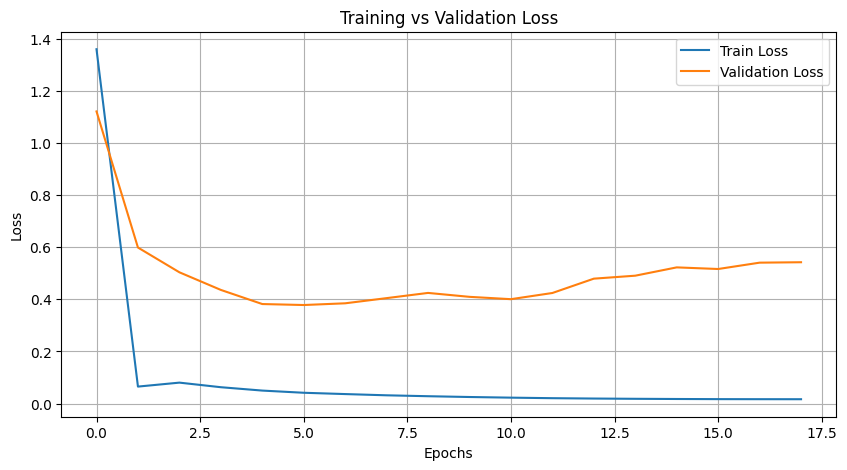

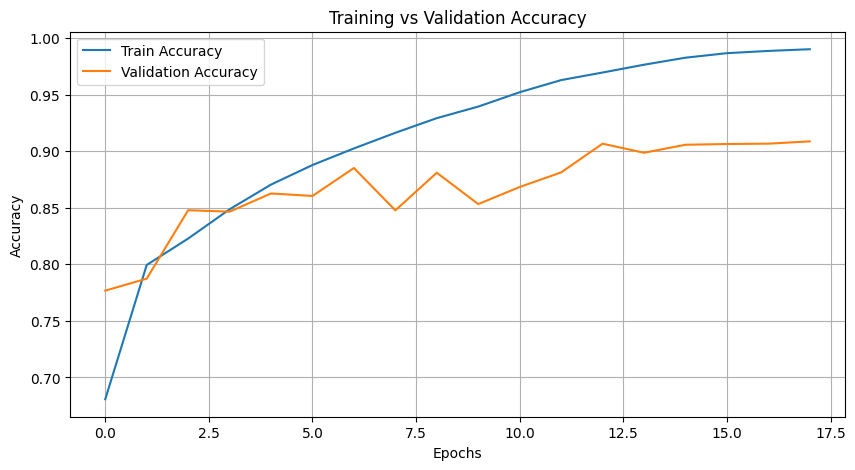

In [ ]:
import matplotlib.pyplot as plt

# Plot Training vs Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(model.train_losses, label="Train Loss")
plt.plot(model.val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid()
plt.show()

# Plot Training vs Validation Accuracy
plt.figure(figsize=(10, 5))
plt.plot(model.train_accuracies, label="Train Accuracy")
plt.plot(model.val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.grid()
plt.show()

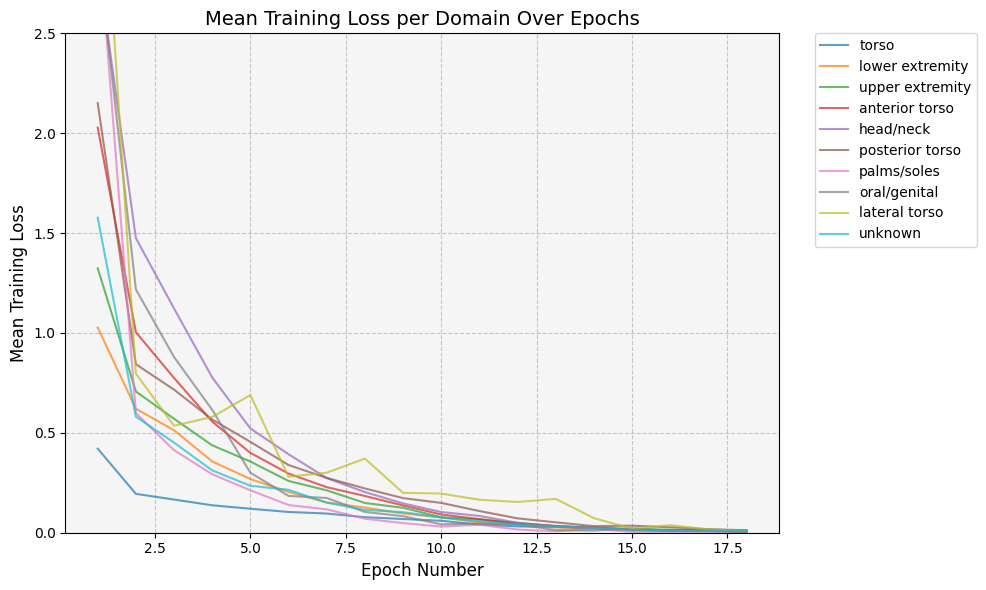

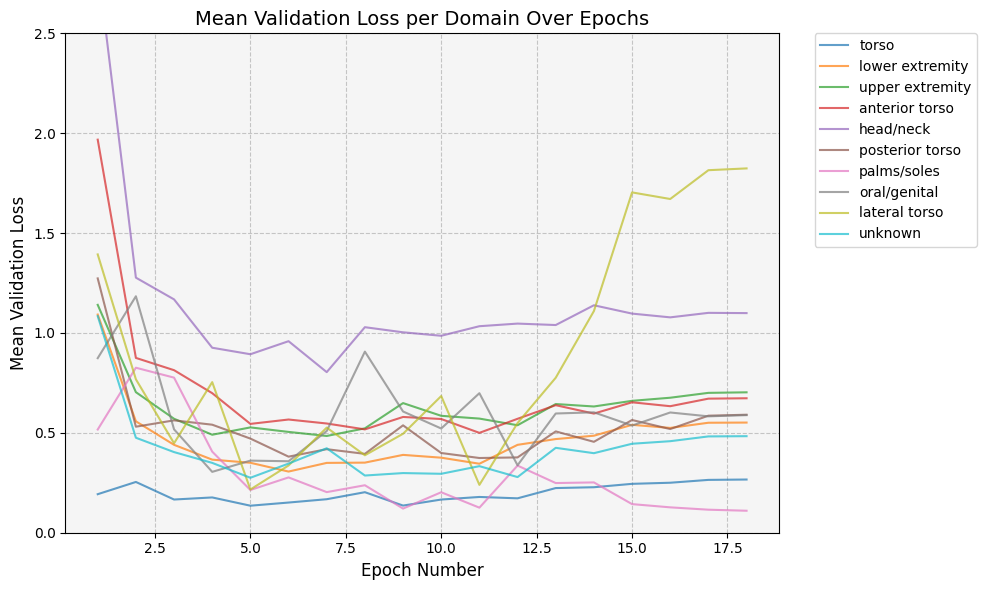

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Map domain IDs to names
domain_id_to_name = {
    0: 'torso',
    1: 'lower extremity',
    2: 'upper extremity',
    3: 'anterior torso',
    4: 'head/neck',
    5: 'posterior torso',
    6: 'palms/soles',
    7: 'oral/genital',
    8: 'lateral torso',
    9: 'unknown'
}

# Plot Mean Training Loss per Domain Over Epochs
plt.figure(figsize=(10, 6))
for domain, losses in model.epoch_domain_train_losses.items():
    if losses:  # Only plot if there are losses
        plt.plot(range(1, len(losses) + 1), losses, label=domain_id_to_name[domain], alpha=0.7)

plt.xlabel('Epoch Number', fontsize=12)
plt.ylabel('Mean Training Loss', fontsize=12)
plt.title('Mean Training Loss per Domain Over Epochs', fontsize=14)
plt.ylim(0, 2.5)  # Set consistent y-axis range
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().set_facecolor('#f5f5f5')
plt.show()

# Plot Mean Validation Loss per Domain Over Epochs (already present)
plt.figure(figsize=(10, 6))
for domain, losses in model.epoch_domain_val_losses.items():
    if losses:  # Only plot if there are losses
        plt.plot(range(1, len(losses) + 1), losses, label=domain_id_to_name[domain], alpha=0.7)

plt.xlabel('Epoch Number', fontsize=12)
plt.ylabel('Mean Validation Loss', fontsize=12)
plt.title('Mean Validation Loss per Domain Over Epochs', fontsize=14)
plt.ylim(0, 2.5)  # Set consistent y-axis range
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().set_facecolor('#f5f5f5')
plt.show()
# After each plt.show(), add:
plt.savefig('mean_training_loss_per_domain.png', bbox_inches='tight', dpi=300)
plt.savefig('mean_validation_loss_per_domain.png', bbox_inches='tight', dpi=300)

Loading best checkpoint for testing: skin_lesion_model_dat_learned/best_model.ckpt
Successfully loaded pre-trained weights for ViT: 86389248 parameters
Testing the model using BaseEvaluator...
Successfully loaded pre-trained weights for ViT: 86389248 parameters


<ipython-input-13-fa40adce34bb>:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(self.checkpoint_path, map_location=self.device)


Checkpoint loaded successfully!
Batch 1: Collected 16 predictions
Batch 2: Collected 16 predictions
Batch 3: Collected 16 predictions
Batch 4: Collected 16 predictions
Batch 5: Collected 16 predictions
Batch 6: Collected 16 predictions
Batch 7: Collected 16 predictions
Batch 8: Collected 16 predictions
Batch 9: Collected 16 predictions
Batch 10: Collected 16 predictions
Batch 11: Collected 16 predictions
Batch 12: Collected 16 predictions
Batch 13: Collected 16 predictions
Batch 14: Collected 16 predictions
Batch 15: Collected 16 predictions
Batch 16: Collected 16 predictions
Batch 17: Collected 16 predictions
Batch 18: Collected 16 predictions
Batch 19: Collected 16 predictions
Batch 20: Collected 16 predictions
Batch 21: Collected 16 predictions
Batch 22: Collected 16 predictions
Batch 23: Collected 16 predictions
Batch 24: Collected 16 predictions
Batch 25: Collected 16 predictions
Batch 26: Collected 16 predictions
Batch 27: Collected 16 predictions
Batch 28: Collected 16 predictio

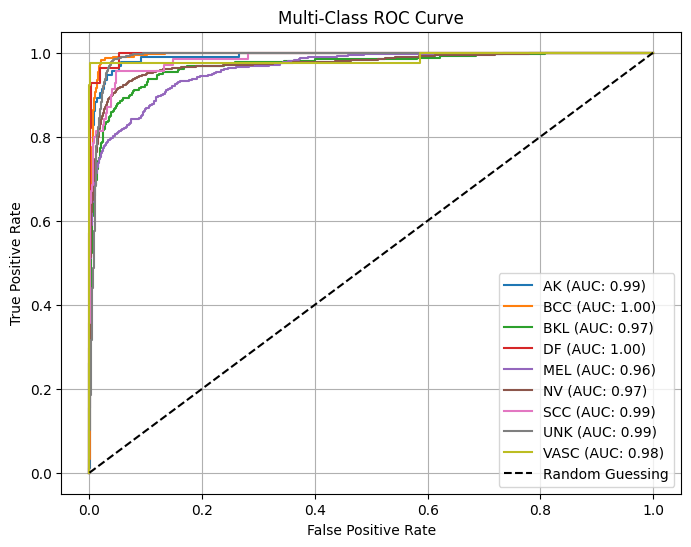

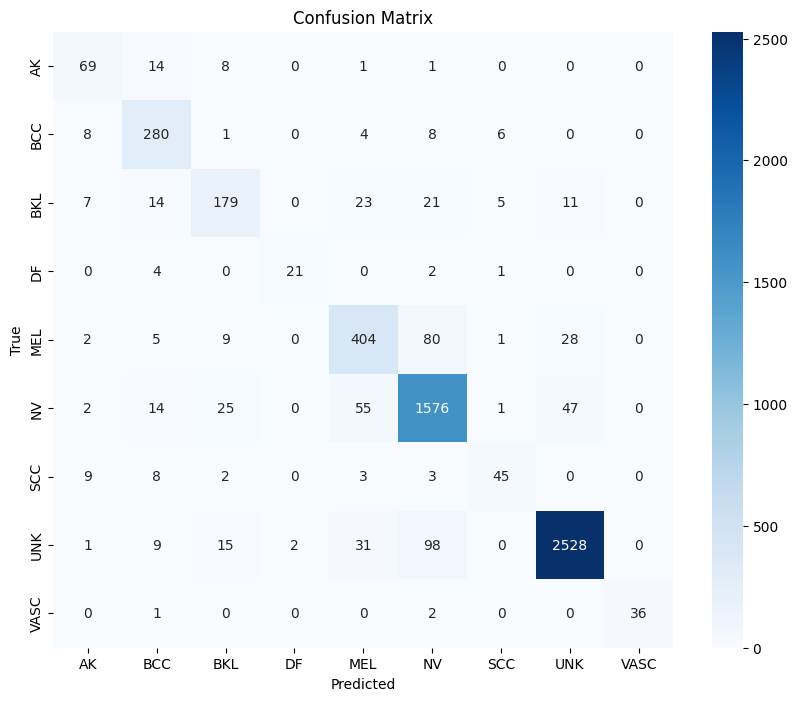


Plotting first 10 images with predictions:


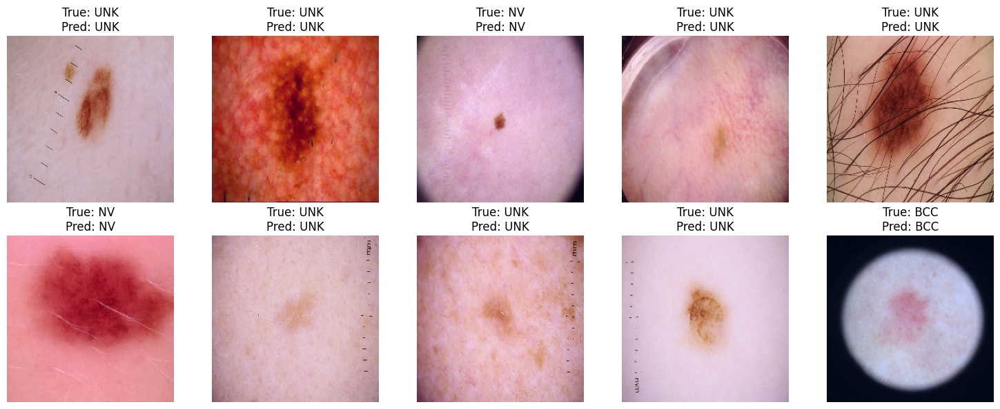

In [ ]:
best_checkpoint_path = os.path.join(NET_FOLDER, f"{BEST_WEIGHTS_FILE}.ckpt")
if os.path.exists(best_checkpoint_path):
    print(f"Loading best checkpoint for testing: {best_checkpoint_path}")
    model = DomainAdaptiveViT.load_from_checkpoint(best_checkpoint_path)
    model.evaluator.checkpoint_path = best_checkpoint_path  # Set for evaluator if needed
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    # Test the model (assuming test_dataloader is defined)
    print("Testing the model using BaseEvaluator...")
    # trainer.test(model, test_dataloader)  # Alternatively, use trainer.test
    model.evaluator.evaluate(test_dataloader)  # Direct call to evaluator
else:
    print(f"Best checkpoint not found at {best_checkpoint_path}. Cannot proceed with testing.")

In [ ]:
# Save the model's state dictionary
torch.save(model.state_dict(), "trained_model_dat_vit_LEARNED.pth")

In [ ]:
# Extract layer names
layer_names = [name for name, param in model.named_parameters()]
layer_names.reverse()  # Reverse to start from the last layers

# Print first few layers to verify
print("layer names (from the last layers):")
print(layer_names)

layer names (from the last layers):
['fc.bias', 'fc.weight', 'domain_adaptive_attention.proj.bias', 'domain_adaptive_attention.proj.weight', 'domain_adaptive_attention.domain_scaling.bias', 'domain_adaptive_attention.domain_scaling.weight', 'domain_adaptive_attention.value.bias', 'domain_adaptive_attention.value.weight', 'domain_adaptive_attention.key.bias', 'domain_adaptive_attention.key.weight', 'domain_adaptive_attention.query.bias', 'domain_adaptive_attention.query.weight', 'domain_embedding.weight', 'vit.pooler.dense.bias', 'vit.pooler.dense.weight', 'vit.layernorm.bias', 'vit.layernorm.weight', 'vit.encoder.layer.11.layernorm_after.bias', 'vit.encoder.layer.11.layernorm_after.weight', 'vit.encoder.layer.11.layernorm_before.bias', 'vit.encoder.layer.11.layernorm_before.weight', 'vit.encoder.layer.11.output.dense.bias', 'vit.encoder.layer.11.output.dense.weight', 'vit.encoder.layer.11.intermediate.dense.bias', 'vit.encoder.layer.11.intermediate.dense.weight', 'vit.encoder.layer.11.

In [ ]:
!pip install grad-cam
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 55.6 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39680 sha256=58478daf9063cea9a7bded67722d48d6849607120f76f0dafc0af7d814af284e
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.5 MB/s eta 0:00:0000:0100:01


In [ ]:
from transformers import ViTModel
import os

# Verify pre-trained weights load
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,  # Ensure defined
    class_weights_tensor=class_weights_tensor
)
vit = ViTModel.from_pretrained("google/vit-base-patch16-224")
print(f"ViT weights loaded: {sum(p.numel() for p in vit.parameters())} parameters")
model.vit = vit  # Explicitly assign

Successfully loaded pre-trained weights for ViT: 86389248 parameters


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViT weights loaded: 86389248 parameters


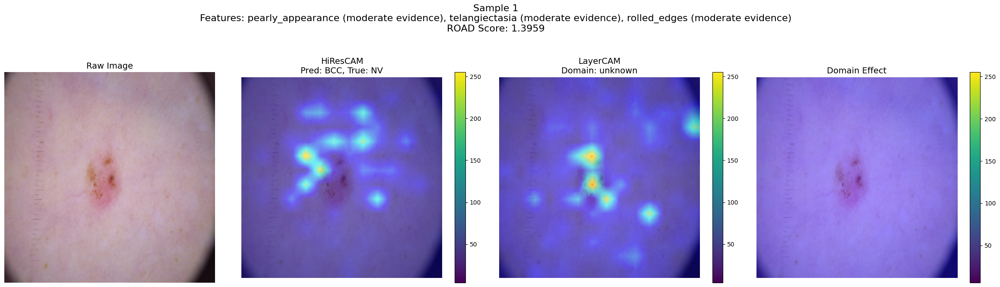

Sample 1: Predicted=BCC, True=NV, ROAD Score=1.3959, Domain=unknown


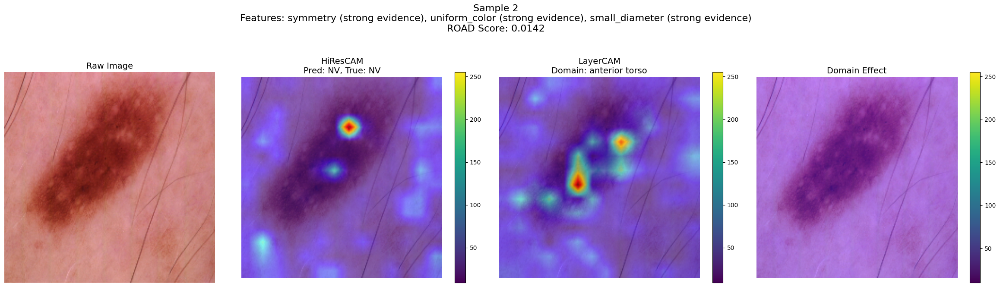

Sample 2: Predicted=NV, True=NV, ROAD Score=0.0142, Domain=anterior torso


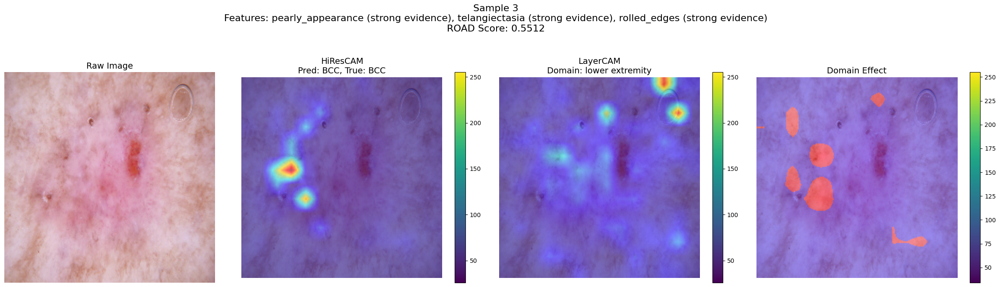

Sample 3: Predicted=BCC, True=BCC, ROAD Score=0.5512, Domain=lower extremity


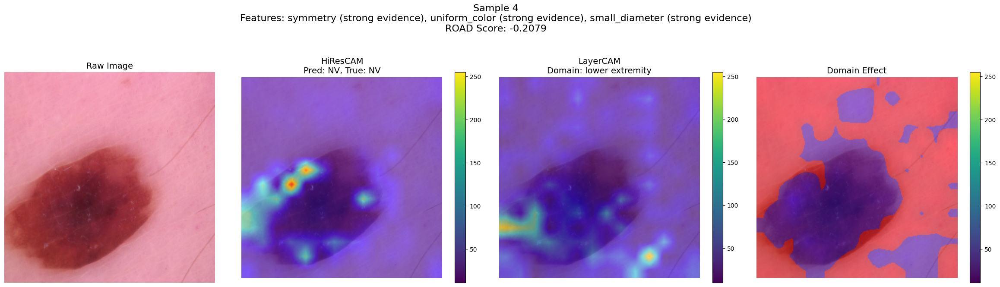

Sample 4: Predicted=NV, True=NV, ROAD Score=-0.2079, Domain=lower extremity


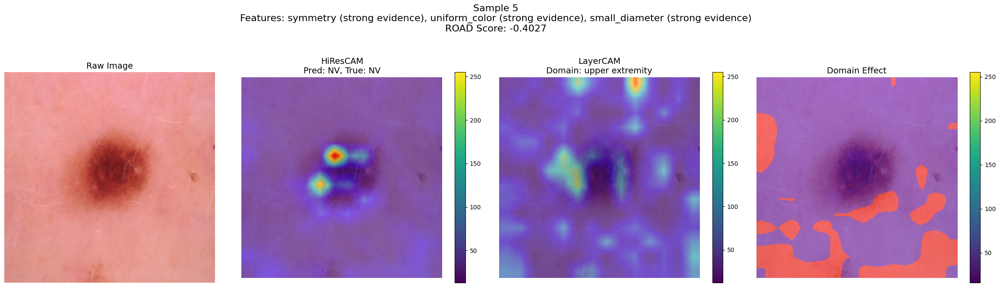

Sample 5: Predicted=NV, True=NV, ROAD Score=-0.4027, Domain=upper extremity


In [ ]:
# XAI Functions
def vit_reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

def denormalize(img_tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * std + mean
    return np.clip(img, 0, 1)

class ModelWithDomain(nn.Module):
    def __init__(self, model, domain_id):
        super().__init__()
        self.model = model
        self.domain_id = domain_id

    def forward(self, x):
        if x.dim() == 3:
            x = x.unsqueeze(0)
        if self.domain_id is None:
            default_domain = torch.tensor([9], device=x.device)
            return self.model(x, default_domain)
        return self.model(x, self.domain_id)

def apply_xai(model, dataloader, num_samples=5):
    model.eval()
    device = next(model.parameters()).device
    targets = [ClassifierOutputTarget(i) for i in range(9)]
    road_metric = ROADMostRelevantFirst(percentile=75)
    target_layers_hires = [model.vit.encoder.layer[-1].layernorm_before]
    target_layers_layer = [model.vit.encoder.layer[0].layernorm_before]

    sample_count = 0
    for batch in dataloader:
        images, labels, domains = batch
        images = images.to(device)
        labels = labels.to(device)
        domains = domains.to(device)

        for i in range(len(images)):
            if sample_count >= num_samples:
                break

            image = images[i]
            label = labels[i].item()
            domain = domains[i].item()
            input_tensor = image.unsqueeze(0).to(device)
            domain_id = torch.tensor([domain], device=device)
            rgb_img = denormalize(image)

            model_with_domain = ModelWithDomain(model, domain_id)
            model_no_domain = ModelWithDomain(model, None)

            with HiResCAM(model=model_with_domain, target_layers=target_layers_hires, reshape_transform=vit_reshape_transform) as cam:
                hires_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                pred_idx = torch.argmax(model_with_domain(input_tensor), dim=1).item()
                hires_vis = show_cam_on_image(rgb_img, hires_cam[0], use_rgb=True)

            with LayerCAM(model=model_with_domain, target_layers=target_layers_layer, reshape_transform=vit_reshape_transform) as cam:
                layer_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                layer_vis = show_cam_on_image(rgb_img, layer_cam[0], use_rgb=True)

            with HiResCAM(model=model_no_domain, target_layers=target_layers_hires, reshape_transform=vit_reshape_transform) as cam:
                no_domain_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                diff_cam = hires_cam[0] - no_domain_cam[0]
                diff_vis = show_cam_on_image(rgb_img, diff_cam, use_rgb=True)

            road_scores = road_metric(input_tensor, hires_cam, targets, model_with_domain)
            road_score_mean = road_scores.mean() if road_scores.size else 0.0

            pred_class = class_names[pred_idx]
            true_class = class_names[label]
            features_detected = []
            cam_max = hires_cam[0].max().item()
            threshold = min(0.3, cam_max * 0.5)
            for feature in ontology[pred_class]:
                if cam_max > threshold:
                    confidence = "strong" if cam_max > 0.7 else "moderate"
                    features_detected.append(f"{feature} ({confidence} evidence)")

            domain_name = list(domain_map.keys())[list(domain_map.values()).index(domain)]

            plt.figure(figsize=(24, 6))
            plt.subplot(1, 4, 1)
            plt.imshow(rgb_img)
            plt.title("Raw Image", fontsize=14)
            plt.axis('off')
            plt.subplot(1, 4, 2)
            plt.imshow(hires_vis)
            plt.title(f"HiResCAM\nPred: {pred_class}, True: {true_class}", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.subplot(1, 4, 3)
            plt.imshow(layer_vis)
            plt.title(f"LayerCAM\nDomain: {domain_name}", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.subplot(1, 4, 4)
            plt.imshow(diff_vis)
            plt.title("Domain Effect", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.suptitle(
                f"Sample {sample_count+1}\n"
                f"Features: {', '.join(features_detected) if features_detected else 'None'}\n"
                f"ROAD Score: {road_score_mean:.4f}",
                fontsize=16, y=1.1
            )
            plt.tight_layout()
            plt.show()

            print(f"Sample {sample_count+1}: Predicted={pred_class}, True={true_class}, ROAD Score={road_score_mean:.4f}, Domain={domain_name}")
            sample_count += 1
        if sample_count >= num_samples:
            break

apply_xai(evaluator.model, test_dataloader, num_samples=5)